## Refine TNK cell annotations for large intestine - relabelling uncertain cells based on manual inspection/majority voting

In [2]:
import scanpy as sc
import pandas as pd
import numpy as np
import sys
import os
from collections import Counter

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import to_hex
import ast

In [3]:
sc.logging.print_header()

scanpy==1.8.0 anndata==0.8.0 umap==0.4.6 numpy==1.20.1 scipy==1.6.1 pandas==1.3.5 scikit-learn==0.24.1 statsmodels==0.13.5 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.3 pynndescent==0.5.2


In [4]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

In [5]:
sc.set_figure_params(
    dpi=200,dpi_save=300,
    fontsize=12,
    frameon=False,
    transparent=True,
)

In [6]:
sns.set_style(style="white")
sns.set_context(context="paper")

### Import

In [7]:
#import data
adata = sc.read_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/disease/compartments/Tcells_pooled_disease.gene_cellbender.good_qc_cluster_mito80.stringent_doublet_removed.hvg7500_noCC.scvi_output.lv20_batch256.with_raw_counts.scArches_broad_pred.20230124.h5ad')

In [8]:
adata

AnnData object with n_obs × n_vars = 89537 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spl

In [9]:
#import scanvi coordinates
adata_scanvi = pd.read_csv('/nfs/team205/ao15/Megagut/Annotations_v3/metadata/X_scANVI/disease/disease_fine_annot_predict_TNK_20230226.csv.gz',compression='gzip',index_col=0)

In [10]:
adata_scanvi

,LV1,LV2,LV3,LV4,LV5,LV6,LV7,LV8,LV9,LV10,LV11,LV12,LV13,LV14,LV15,LV16,LV17,LV18,LV19,LV20
index,,,,,,,,,,,,,,,,,,,,
AAACCTGAGGCCCTCA-4918STDY7273964,-0.893711,-0.052677,-0.201637,0.131956,1.007388,-0.965268,-0.746116,-0.030217,-0.670514,0.863974,0.022658,-0.034989,0.020111,-0.029925,1.111086,-0.056799,-0.030088,-0.252261,0.334017,-0.000853
AAACCTGTCCAAACTG-4918STDY7273964,-0.094313,0.159906,-0.150523,0.015633,-0.075626,0.054341,-0.349800,-0.190158,0.011415,1.276259,-0.104790,0.002419,0.036030,0.022950,-1.331646,-0.084733,-0.123000,-0.861317,-0.034868,0.025142
AAACGGGGTTAAGAAC-4918STDY7273964,-0.452091,-0.588464,0.477104,-0.083655,0.501185,-0.040654,0.628492,0.586342,-0.012193,-0.363493,0.407546,-0.019430,0.009008,-0.041604,-1.133909,-0.040155,-0.135845,1.329180,-0.173905,-0.019247
AAACGGGGTTGAGGTG-4918STDY7273964,0.031480,0.269420,-0.570353,0.040978,0.490107,0.283764,0.162645,0.446006,-0.003175,2.038608,0.178489,0.002165,0.055758,-0.024655,-0.879680,-0.073192,0.308266,-0.708567,-0.525408,-0.014436
AAACGGGTCATAGCAC-4918STDY7273964,0.026928,0.436080,-0.197455,-0.004883,0.069380,0.045874,-0.191007,-0.509009,0.101888,1.412580,0.071360,0.016480,0.030473,0.019318,-1.560949,-0.092981,-0.366436,-0.810616,-0.346847,0.056319
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTCCCAGAGCGTGAGT-GSM4546346,-0.238365,0.570556,0.312066,-0.083714,0.090626,0.190163,0.739915,0.402066,0.018161,-2.144010,-0.179514,-0.001354,0.039936,0.011807,-0.538121,-0.030217,0.278530,1.157382,-0.242671,-0.065734
TTGCGTCGTACAGCAG-GSM4546346,-0.056510,-0.350858,-0.018827,-0.006641,1.106703,-0.491930,0.128192,0.438156,0.657247,-1.858527,-0.316423,-0.005987,0.046164,-0.017975,-0.622345,0.043693,1.078948,1.086118,-0.507720,-0.081278
TTTACTGTCGTGGTCG-GSM4546346,-0.024961,-1.447564,-0.032682,-0.108191,-0.758216,0.155032,0.138148,-1.047324,-0.439705,0.532933,-0.356948,-0.067727,-0.003228,0.016562,-0.698528,-0.024714,-0.166387,1.651463,0.818755,-0.014217


In [11]:
adata.obsm['X_scANVI'] = adata_scanvi

In [12]:
#import metadata
adata_meta = pd.read_csv('/nfs/team205/ao15/Megagut/Annotations_v3/metadata/disease/20230308/scanvi/disease_fine_annot_predict_TNK_20230226.csv',index_col=0)

/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3437: DtypeWarning: Columns (82,83,84,86,100) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [13]:
adata_meta

,latent_cell_probability,latent_RT_efficiency,cecilia22_predH,cecilia22_predH_prob,cecilia22_predH_uncertain,cecilia22_predL,cecilia22_predL_prob,cecilia22_predL_uncertain,elmentaite21_pred,elmentaite21_pred_prob,...,martin19_pred_uncertain,warner20_pred,warner20_pred_prob,warner20_pred_uncertain,broad_predicted_labels,broad_predicted_labels_uncert,fine_annot,fine_predicted_labels,fine_predicted_labels_uncertainty,scanvi_pred
index,,,,,,,,,,,,,,,,,,,,,
AAACCTGAGGCCCTCA-4918STDY7273964,0.999551,1.287072,T cells,0.999993,T cells,Tcm/Naive helper T cells,0.186769,Uncertain,SELL+ CD4 T,0.260945,...,T CD8 naive,Th,0.597118,Th,T and NK cells,1.192093e-07,Unknown,gdT_naive,1.999950e-02,gdT_naive
AAACCTGTCCAAACTG-4918STDY7273964,0.999662,1.191093,T cells,0.999954,T cells,Tcm/Naive helper T cells,0.977933,Tcm/Naive helper T cells,SELL+ CD4 T,0.993349,...,T CD4 naive,Th,0.757285,Th,T and NK cells,5.960464e-08,Unknown,Tnaive/cm_CD4,0.000000e+00,Tnaive/cm_CD4
AAACGGGGTTAAGAAC-4918STDY7273964,0.999334,0.952725,T cells,0.999064,T cells,Tcm/Naive helper T cells,0.513684,Tcm/Naive helper T cells,SELL+ CD4 T,0.924822,...,T CD4 naive,Th,0.821581,Th,T and NK cells,0.000000e+00,Unknown,Tfh_naive,2.800038e-01,Tfh_naive
AAACGGGGTTGAGGTG-4918STDY7273964,0.999739,1.484298,T cells,0.999997,T cells,Tcm/Naive cytotoxic T cells,0.827235,Tcm/Naive cytotoxic T cells,SELL+ CD8 T,0.991261,...,T CD4 naive,Th,0.873305,Th,T and NK cells,0.000000e+00,Unknown,Tnaive/cm_CD4,4.999978e-01,Tnaive/cm_CD8
AAACGGGTCATAGCAC-4918STDY7273964,0.999727,1.730684,T cells,0.999999,T cells,Tcm/Naive helper T cells,0.977065,Tcm/Naive helper T cells,SELL+ CD4 T,0.961483,...,T CD4 naive,Th,0.737614,Th,T and NK cells,1.192093e-07,Unknown,Tnaive/cm_CD4,1.192093e-07,Tnaive/cm_CD4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTCCCAGAGCGTGAGT-GSM4546346,0.999724,1.267164,T cells,0.999987,T cells,Regulatory T cells,0.966140,Regulatory T cells,Treg,0.955323,...,T reg,Tc 1,0.476054,Tc 1,T and NK cells,0.000000e+00,Unknown,Trm_Th17,1.999873e-02,Trm_Th17
TTGCGTCGTACAGCAG-GSM4546346,0.999578,0.989256,T cells,0.997926,T cells,Regulatory T cells,0.072309,Uncertain,Treg,0.998598,...,T reg,Th,0.502032,Th,T and NK cells,0.000000e+00,Unknown,Trm_Th17,2.399839e-01,Trm_Th17
TTTACTGTCGTGGTCG-GSM4546346,0.999522,1.008884,T cells,0.999693,T cells,Regulatory T cells,0.957911,Regulatory T cells,Treg,0.774459,...,T reg,Th,0.739649,Th,T and NK cells,0.000000e+00,Unknown,Tnaive/cm_CD4,6.999848e-01,Treg


In [14]:
adata.obs = adata_meta

### Process

In [15]:
#compute neighbours and umap
sc.pp.neighbors(adata, use_rep="X_scANVI")
sc.tl.umap(adata)

/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


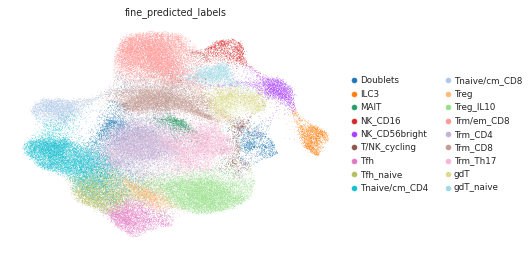

In [16]:
sc.pl.umap(adata, color=['fine_predicted_labels'])

In [17]:
adata.obs.donor_disease.unique()

['PIBD', 'cancer', 'UC', 'CD']
Categories (4, object): ['CD', 'PIBD', 'UC', 'cancer']

In [18]:
#fix metadata
adata.obs['disease'] = adata.obs['donor_category'].astype(str) + '_' + adata.obs['donor_disease'].astype(str)

In [19]:
list(adata.obs.disease.unique())

['disease_PIBD', 'disease_cancer', 'disease_UC', 'disease_CD']

In [20]:
adata.obs.disease.value_counts()

disease_cancer    30647
disease_CD        29854
disease_PIBD      22945
disease_UC         6091
Name: disease, dtype: int64

In [21]:
adata.obs.donor_disease.unique()

['PIBD', 'cancer', 'UC', 'CD']
Categories (4, object): ['CD', 'PIBD', 'UC', 'cancer']

In [22]:
adata.obs['disease'] = (adata.obs['disease'].map(lambda x:{
'disease_cancer':'cancer',
    'disease_PIBD':'pediatric_IBD',
    'disease_UC':'ulcertaive_colitis',
    'disease_CD':'crohns_disease'
    }.get(x,x)).astype("category"))

In [23]:
cancer = adata[adata.obs['disease'].isin(['cancer'])].copy()

In [24]:
cancer.obs.disease.value_counts()

cancer    30647
Name: disease, dtype: int64

In [25]:
cancer.obs['disease'] = cancer.obs['disease'].astype(str) + '_' + cancer.obs['organ_unified'].astype(str)

In [26]:
cancer.obs.disease.value_counts()

cancer_stomach            23636
cancer_rectum              2805
cancer_colon               2409
cancer_sigmoid colon        957
cancer_caecum               812
cancer_ascending colon       28
Name: disease, dtype: int64

In [27]:
cancer.obs['disease'] = (cancer.obs['disease'].map(lambda x:{'cancer_caecum':'cancer_colorectal',
 'cancer_rectum':'cancer_colorectal',
 'cancer_sigmoid colon':'cancer_colorectal',
 'cancer_colon':'cancer_colorectal',
 'cancer_ascending colon':'cancer_colorectal',
 'cancer_stomach':'cancer_gastric'}.get(x,x)).astype("category"))

In [28]:
cancer.obs.disease.value_counts()

cancer_gastric       23636
cancer_colorectal     7011
Name: disease, dtype: int64

In [29]:
ON = {O:N for O,N in zip(cancer.obs_names,cancer.obs["disease"])}
adata.obs["disease"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["disease"])]
adata.obs.disease.value_counts()

crohns_disease        29854
cancer_gastric        23636
pediatric_IBD         22945
cancer_colorectal      7011
ulcertaive_colitis     6091
Name: disease, dtype: int64

In [30]:
list(adata.obs.disease.unique())

['pediatric_IBD',
 'cancer_colorectal',
 'ulcertaive_colitis',
 'crohns_disease',
 'cancer_gastric']

In [31]:
adata.obs['disease'] = adata.obs['disease'].astype('category')

In [32]:
adata.obs['disease'] = (adata.obs['disease'].map(lambda x:{'ulcertaive_colitis':'ulcerative_colitis'}.get(x,x)).astype("category"))

In [33]:
adata.obs['disease'].cat.reorder_categories([
 'crohns_disease',
 'ulcerative_colitis',
 'pediatric_IBD',
 'cancer_colorectal',
 'cancer_gastric'], inplace=True)

<ipython-input-33-b0e974b68020>:1: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  adata.obs['disease'].cat.reorder_categories([


/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


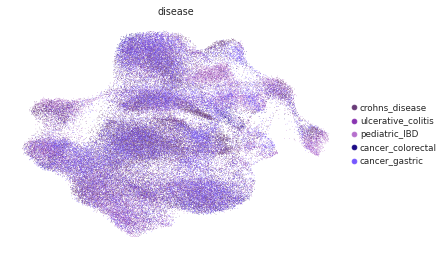

In [34]:
#plot umaps
sc.pl.umap(adata,color = 'disease',palette=[#'#ADD3DD',#control
                                    #'#ffb7b7',#'inutero',
                                     #'#f48154',#'preterm',
                                    '#693C78',#crohn's disease
                                            '#8934B1',#UC
                                            '#B670CD',#PIBD
                                            '#1C0B86',#colorectal cancer
                                            '#7657ff',#gastric cancer
                                           ])

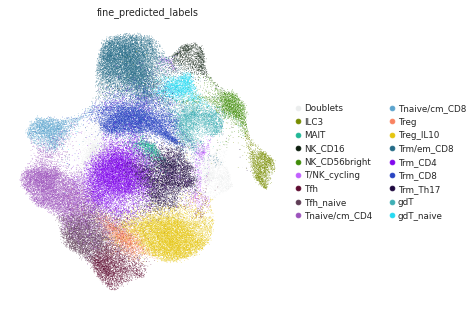

In [35]:
plt.rcParams['figure.figsize'] = [5,5]
sc.pl.umap(adata,color='fine_predicted_labels',palette = ['#ebeded',#doublets
                                                          '#778c00', #ILC3
'#21b796', #MAIT
'#0c1e0e',#NK_CD16
'#3f8c08', #NK CD56
'#c260ff',#T/NK cyling 
'#5e0b30',#Tfh
'#5e3c55',#tfh naive                             
'#9c53bc',#Tnaive/cm CD4
'#5ca4ce',#t naive/CM Cd8
'#f98261',#treg
'#e5c510',#treg il10
'#256b87',#Tem CD8
'#8107ed',#trm cd4                                
'#2844c1',#trm cd8
'#1e093f',#trm th17
'#3fafb5',#gdt                               
#'#5ac4e8',#Tem/emra cd8
'#26daf2'#gdt naive
                                                         ],size=1.5)

In [36]:
adata.X.max()

7139.0

In [37]:
adata.layers['counts'] = adata.X

In [38]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

In [39]:
marker_genes_dict = {'General T cell markers': ['CD3D','CD3E','CD3G','CD8A','CD8B','CD4'],
                     'ILC3': ['RORC','PCDH9','KIT','LST1','IL7R'],
                     'MAIT': ['SLC4A10','TRAV1-2'],
                     'NK_CD16': ['FCGR3A','GNLY','GZMB','NKG7'],
                     'NK_CD56bright': ['XCL1','IL2RB','NCAM1','NCR1','FCER1G'],
                     'T follicular helper markers':['CXCR5','BCL6','PDCD1','CD40LG'],
                     'Naive T cell markers': ['CCR7','SELL'],
                     'Tregs': ['FOXP3','CTLA4','IL2RA','IL10'],
                    'Trm/em_CD8':['GZMK','CRTAM','EOMES'],
                    'Tissue resident memory T markers':['ITGAE','ITGA1','SPRY1'],
                    'Trm_Th17':['IL17A','CCR6','CCL20'],
                    'gdT markers':['KLRC2','TRDC','TRGC1','KIR2DL4']}

In [40]:
adata

AnnData object with n_obs × n_vars = 89537 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spl

/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


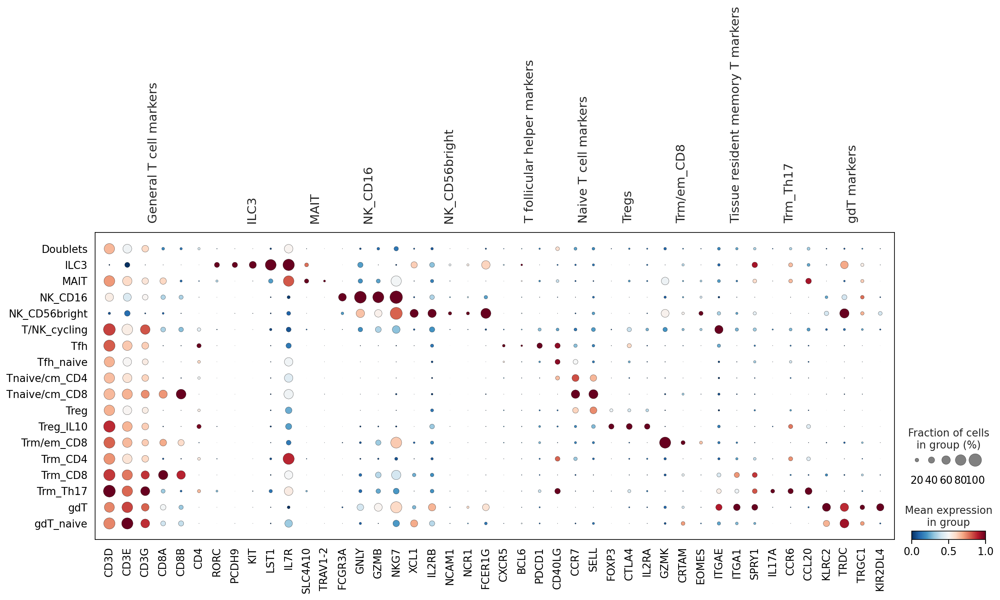

In [41]:
#plot markers
sc.set_figure_params(dpi_save = 300)
sc.pl.dotplot(adata,var_names=marker_genes_dict,groupby='fine_predicted_labels',color_map='RdBu_r', standard_scale='var')

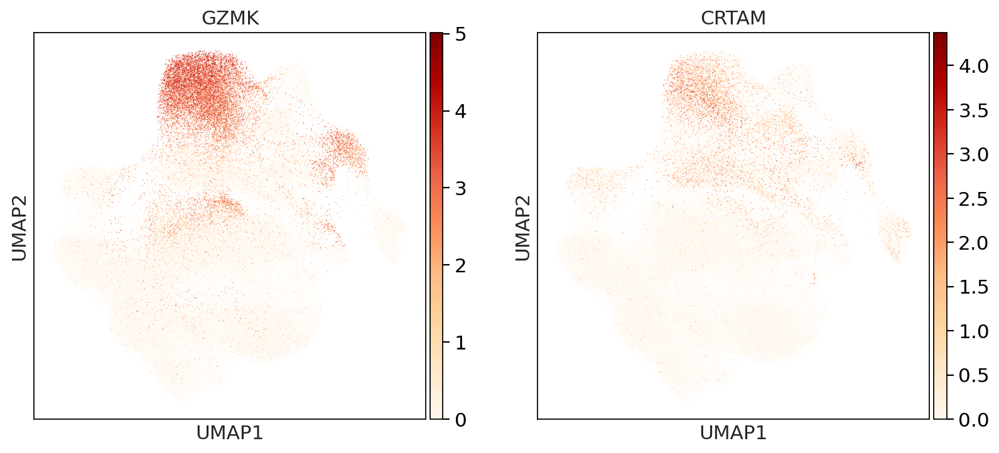

In [86]:
sc.pl.umap(adata,color=['GZMK','CRTAM'],cmap='OrRd')

### Define uncertain cells

In [43]:
uncert = adata.obs[['fine_predicted_labels','fine_predicted_labels_uncertainty']] 

In [44]:
#calculate 90th percentile to use as cut off for uncertain cells
p = np.percentile(adata.obs['fine_predicted_labels_uncertainty'], 90) # return 90th percentile
print(p)

0.5200046300888062


(array([2.4054e+04, 5.4920e+03, 8.0160e+03, 3.2290e+03, 5.4750e+03,
        2.3590e+03, 4.3310e+03, 2.0410e+03, 1.9330e+03, 3.6290e+03,
        1.7250e+03, 3.4670e+03, 1.6770e+03, 3.3890e+03, 1.6950e+03,
        1.7030e+03, 3.4920e+03, 1.7660e+03, 2.9000e+03, 1.2630e+03,
        2.1220e+03, 8.9000e+02, 7.8200e+02, 1.1400e+03, 3.7800e+02,
        4.1900e+02, 1.0500e+02, 5.9000e+01, 5.0000e+00, 1.0000e+00]),
 array([0.        , 0.02866588, 0.05733176, 0.08599765, 0.11466353,
        0.14332941, 0.17199529, 0.20066117, 0.22932705, 0.25799294,
        0.28665882, 0.3153247 , 0.34399058, 0.37265646, 0.40132235,
        0.42998823, 0.45865411, 0.48731999, 0.51598587, 0.54465176,
        0.57331764, 0.60198352, 0.6306494 , 0.65931528, 0.68798116,
        0.71664705, 0.74531293, 0.77397881, 0.80264469, 0.83131057,
        0.85997646]),
 <BarContainer object of 30 artists>)

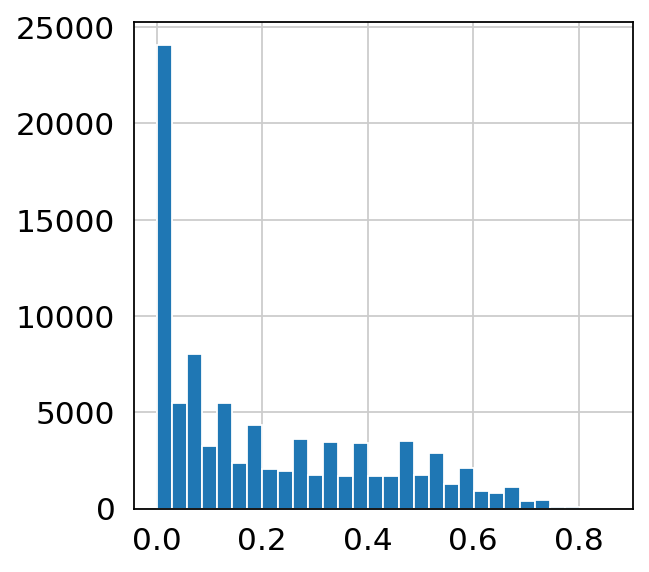

In [45]:
#plot uncertainty distribution
plt.hist(adata.obs['fine_predicted_labels_uncertainty'], bins=30)

In [46]:
uncert['fine_predicted_labels'] = uncert['fine_predicted_labels'].cat.add_categories('Unknown')

<ipython-input-46-905f2ed234d6>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  uncert['fine_predicted_labels'] = uncert['fine_predicted_labels'].cat.add_categories('Unknown')


In [47]:
adata.obs['fine_predicted_labels'].unique()

['gdT_naive', 'Tnaive/cm_CD4', 'Tfh_naive', 'Tfh', 'Treg_IL10', ..., 'NK_CD56bright', 'T/NK_cycling', 'ILC3', 'gdT', 'MAIT']
Length: 18
Categories (18, object): ['Doublets', 'ILC3', 'MAIT', 'NK_CD16', ..., 'Trm_CD8', 'Trm_Th17', 'gdT', 'gdT_naive']

In [48]:
#mark cells are unknown based on cut off of 90th percentile
uncert.loc[uncert["fine_predicted_labels_uncertainty"] > p, "fine_predicted_labels"] = "Unknown"

/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


In [49]:
adata.obs['fine_predicted_labels_uncertflagged'] = adata.obs['fine_predicted_labels']

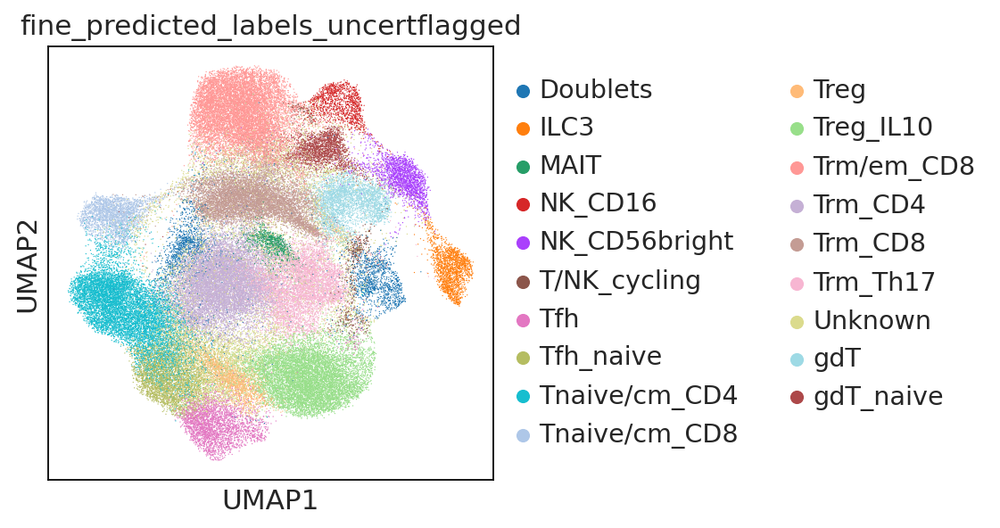

In [50]:
ON = {O:N for O,N in zip(uncert.index,uncert["fine_predicted_labels"])}
adata.obs["fine_predicted_labels_uncertflagged"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["fine_predicted_labels_uncertflagged"])]
sc.pl.umap(adata,color='fine_predicted_labels_uncertflagged')

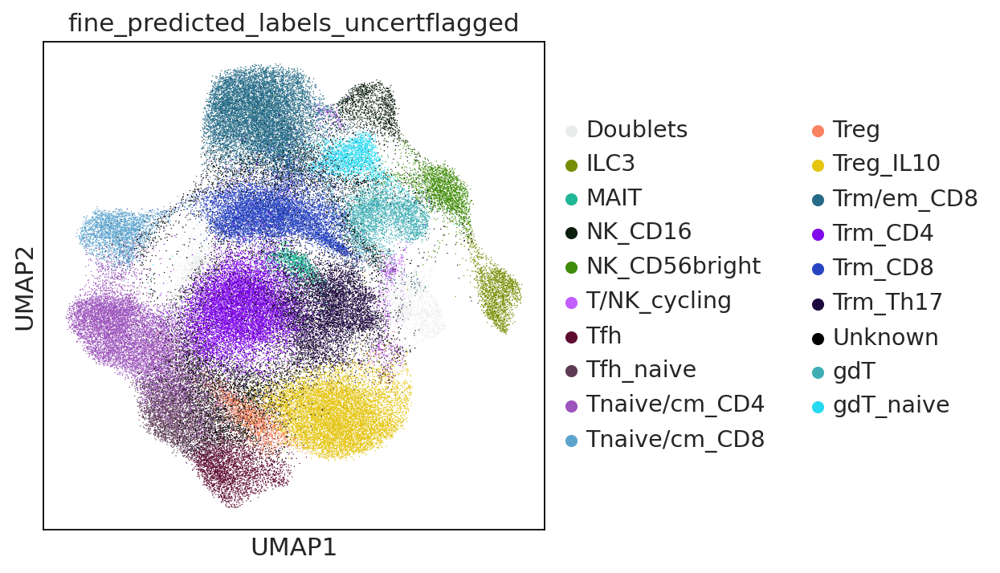

In [51]:
plt.rcParams['figure.figsize'] = [5,5]
sc.pl.umap(adata,color='fine_predicted_labels_uncertflagged',palette = ['#ebeded',#doublets
                                                          '#778c00', #ILC3
'#21b796', #MAIT
'#0c1e0e',#NK_CD16
'#3f8c08', #NK CD56
'#c260ff',#T/NK cyling 
'#5e0b30',#Tfh
'#5e3c55',#tfh naive                             
'#9c53bc',#Tnaive/cm CD4
'#5ca4ce',#t naive/CM Cd8
'#f98261',#treg
'#e5c510',#treg il10
'#256b87',#Tem CD8
'#8107ed',#trm cd4                                
'#2844c1',#trm cd8
'#1e093f',#trm th17
                                                                        '#000000',#unknown
'#3fafb5',#gdt                               
#'#5ac4e8',#Tem/emra cd8
                                                                           
'#26daf2',#gdt naive
                                                       
                                               
                                               
    
    
                                              ],size=1.5)

### Finalise annotations
- calculate leiden clusters
- inspect annotations across leiden clusters
- assess marker genes, doublet markers, donor distribution
- relabel based on majority voting of leiden clusters, along with confirmation from marker genes etc.

In [52]:
#reassign labels for unknown cells by leiden clustering and majority voting
sc.tl.leiden(adata,resolution=1,key_added='leiden1')

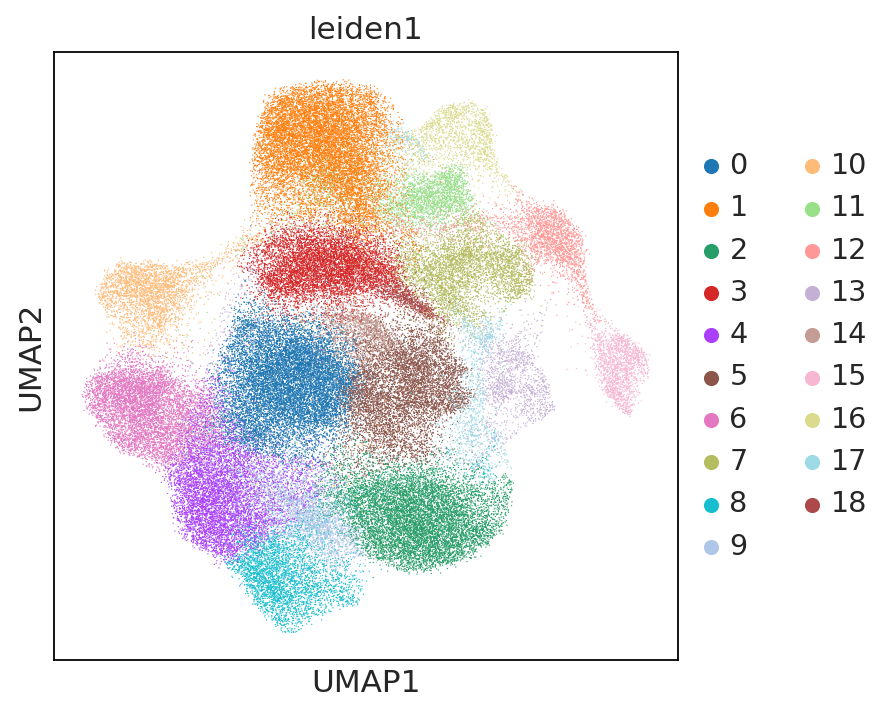

In [53]:
sc.pl.umap(adata,color='leiden1')

In [54]:
pd.crosstab(adata.obs.leiden1,adata.obs.fine_predicted_labels_uncertflagged)

fine_predicted_labels_uncertflagged,Doublets,ILC3,MAIT,NK_CD16,NK_CD56bright,T/NK_cycling,Tfh,Tfh_naive,Tnaive/cm_CD4,Tnaive/cm_CD8,Treg,Treg_IL10,Trm/em_CD8,Trm_CD4,Trm_CD8,Trm_Th17,Unknown,gdT,gdT_naive
leiden1,,,,,,,,,,,,,,,,,,,
0,959,2,1,0,0,0,0,15,265,0,0,2,1,8763,0,556,1174,0,0
1,35,0,1,1,6,0,8,0,1,0,0,22,10199,91,382,0,644,3,0
2,12,0,1,0,0,0,13,3,1,0,66,8539,4,71,0,21,421,0,0
3,108,0,0,0,0,0,0,0,2,4,0,0,9,259,6277,15,452,1,2
4,133,0,0,0,0,0,5,3555,1834,0,5,45,0,109,0,3,1340,0,0
5,20,0,46,0,0,0,2,3,0,0,0,116,8,723,29,5223,768,20,0
6,35,0,0,0,0,0,1,8,6274,0,3,0,3,81,0,0,136,0,1
7,20,4,0,0,14,22,3,0,0,0,0,3,47,0,553,60,466,3064,165
8,17,0,0,0,0,3,3030,214,81,0,1,103,0,0,0,2,574,0,0


In [55]:
#Use Leiden resolution 1
unknown = adata.obs[['leiden1','fine_predicted_labels_uncertflagged']]

In [56]:
unknown = unknown[unknown['fine_predicted_labels_uncertflagged'].isin(['Unknown'])]

In [57]:
unknown

,leiden1,fine_predicted_labels_uncertflagged
index,,
AACACGTCAAAGGAAG-4918STDY7273964,0,Unknown
AACACGTCATTTCACT-4918STDY7273964,8,Unknown
AACTCAGAGTGTACTC-4918STDY7273964,6,Unknown
AACTCAGCAACGCACC-4918STDY7273964,8,Unknown
AACTCAGGTCCGAATT-4918STDY7273964,11,Unknown
...,...,...
GACTGCGAGAGGGATA-GSM4546346,17,Unknown
GAGTCCGAGTACCGGA-GSM4546346,11,Unknown
TATCAGGCAGTATGCT-GSM4546346,7,Unknown


/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


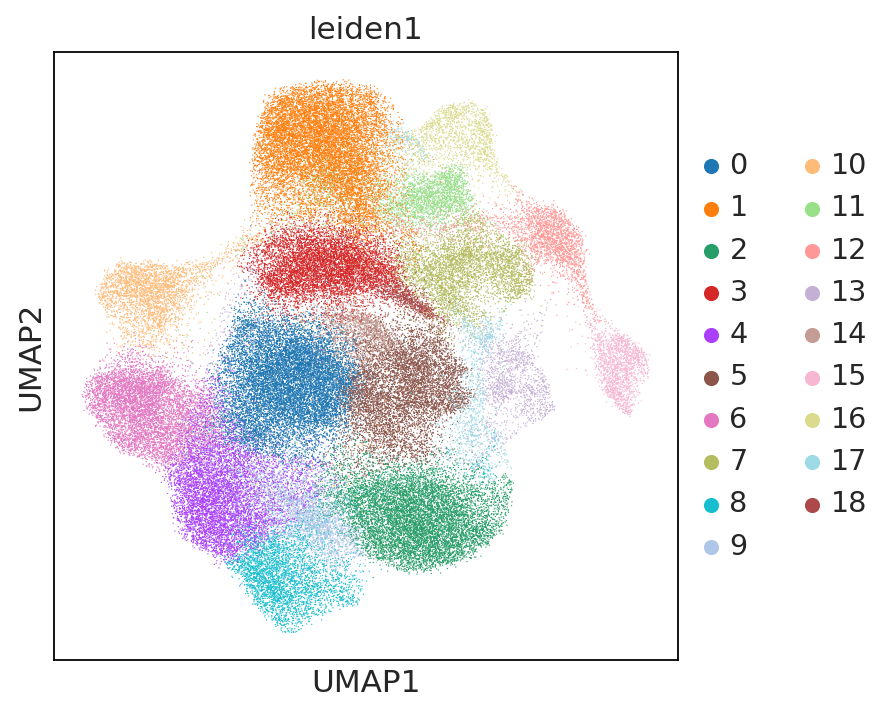

In [58]:
sc.pl.umap(adata,color='leiden1')

/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


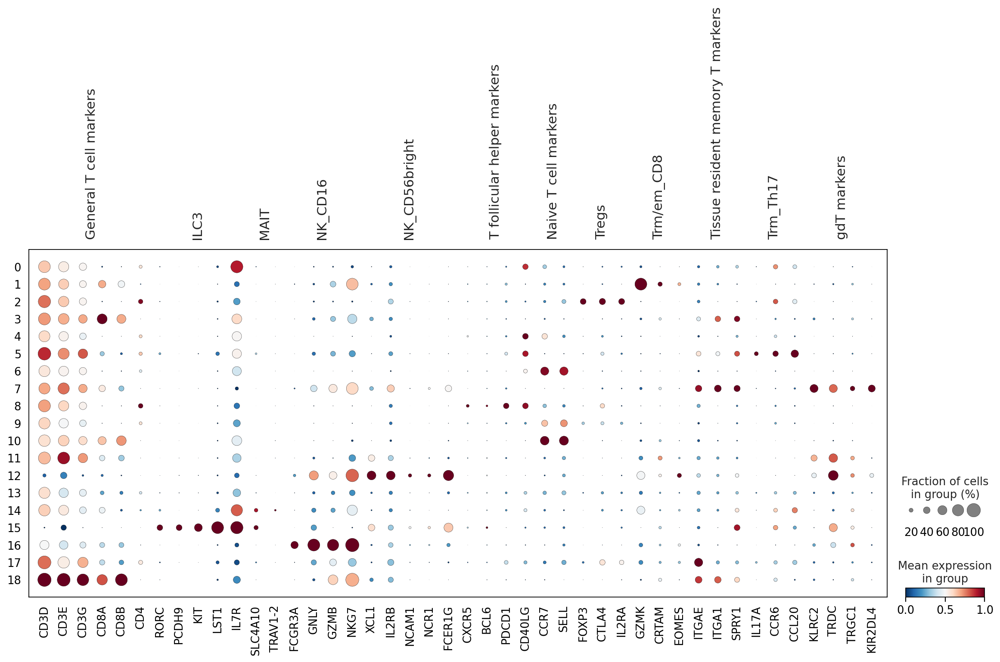

In [59]:
sc.pl.dotplot(adata,var_names=marker_genes_dict,groupby='leiden1',color_map='RdBu_r', standard_scale='var')

In [60]:
pd.crosstab(adata.obs.leiden1,adata.obs.fine_predicted_labels_uncertflagged)

fine_predicted_labels_uncertflagged,Doublets,ILC3,MAIT,NK_CD16,NK_CD56bright,T/NK_cycling,Tfh,Tfh_naive,Tnaive/cm_CD4,Tnaive/cm_CD8,Treg,Treg_IL10,Trm/em_CD8,Trm_CD4,Trm_CD8,Trm_Th17,Unknown,gdT,gdT_naive
leiden1,,,,,,,,,,,,,,,,,,,
0,959,2,1,0,0,0,0,15,265,0,0,2,1,8763,0,556,1174,0,0
1,35,0,1,1,6,0,8,0,1,0,0,22,10199,91,382,0,644,3,0
2,12,0,1,0,0,0,13,3,1,0,66,8539,4,71,0,21,421,0,0
3,108,0,0,0,0,0,0,0,2,4,0,0,9,259,6277,15,452,1,2
4,133,0,0,0,0,0,5,3555,1834,0,5,45,0,109,0,3,1340,0,0
5,20,0,46,0,0,0,2,3,0,0,0,116,8,723,29,5223,768,20,0
6,35,0,0,0,0,0,1,8,6274,0,3,0,3,81,0,0,136,0,1
7,20,4,0,0,14,22,3,0,0,0,0,3,47,0,553,60,466,3064,165
8,17,0,0,0,0,3,3030,214,81,0,1,103,0,0,0,2,574,0,0


In [61]:
unknown_adata = adata[adata.obs['fine_predicted_labels_uncertflagged'].isin(['Unknown'])].copy()

/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


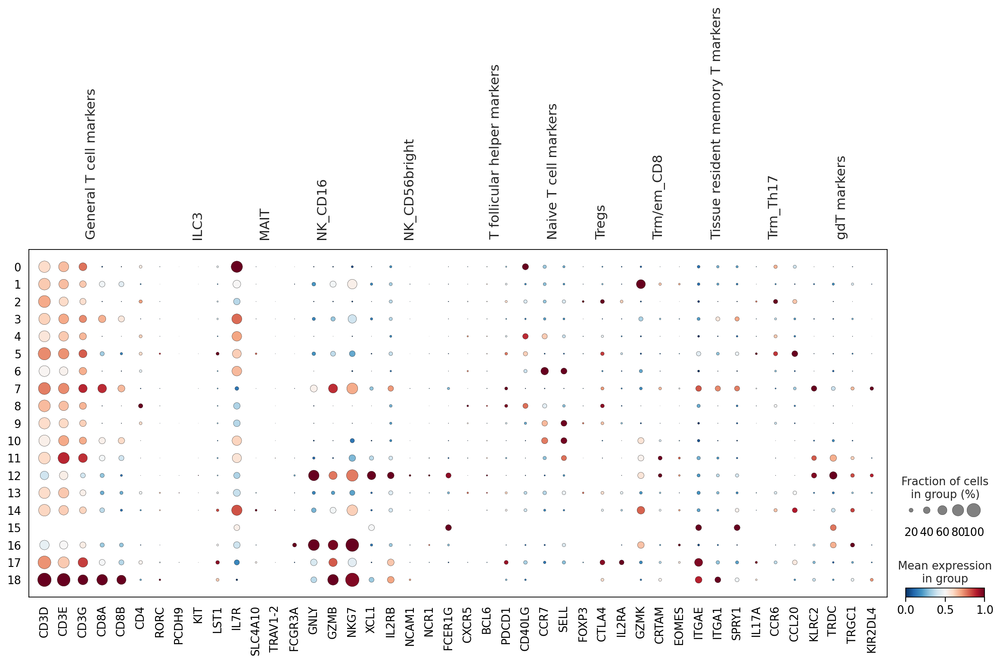

In [62]:
sc.pl.dotplot(unknown_adata,var_names=marker_genes_dict,groupby='leiden1',color_map='RdBu_r', standard_scale='var')

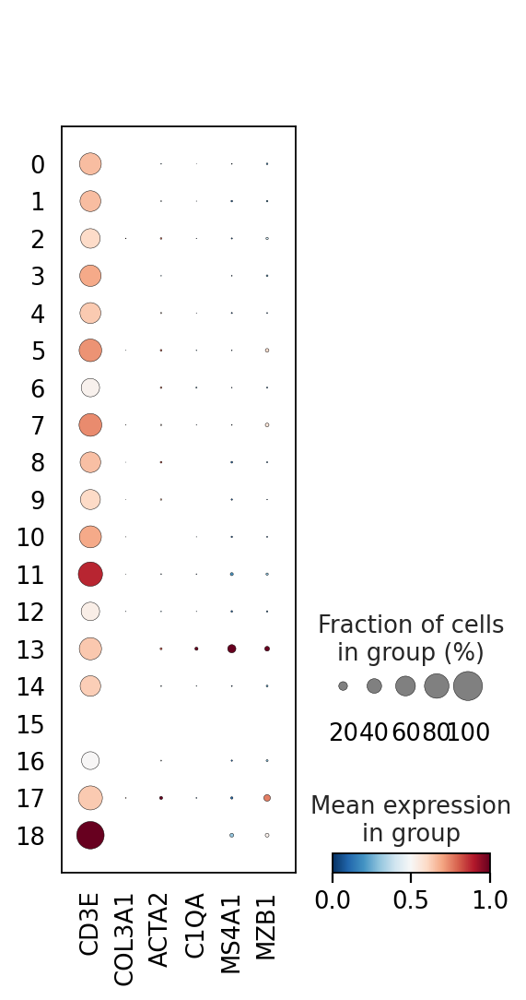

In [63]:
#plot some doublet markers
sc.pl.dotplot(unknown_adata,var_names=['CD3E','COL3A1','ACTA2','C1QA','MS4A1','MZB1'],groupby='leiden1',color_map='RdBu_r', standard_scale='var')

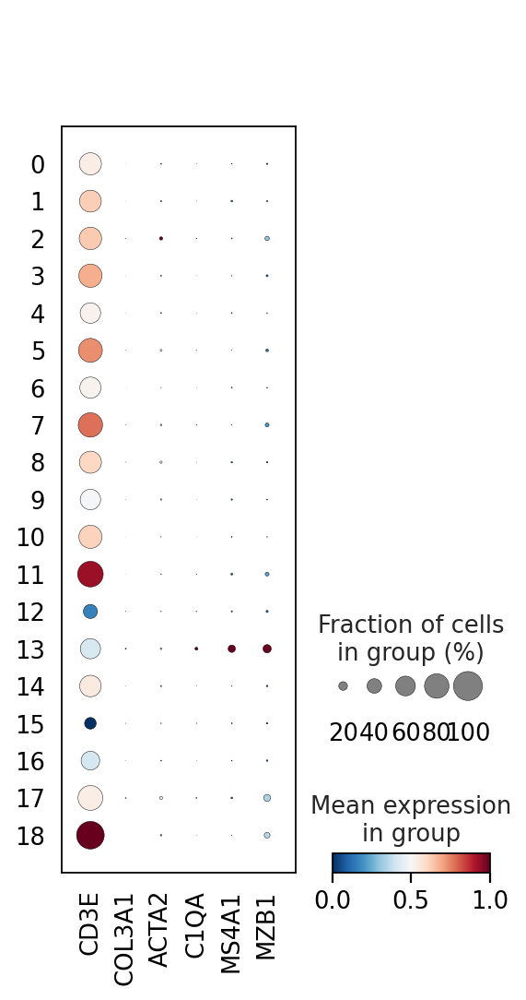

In [64]:
#plot some doublet markers
sc.pl.dotplot(adata,var_names=['CD3E','COL3A1','ACTA2','C1QA','MS4A1','MZB1'],groupby='leiden1',color_map='RdBu_r', standard_scale='var')

/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


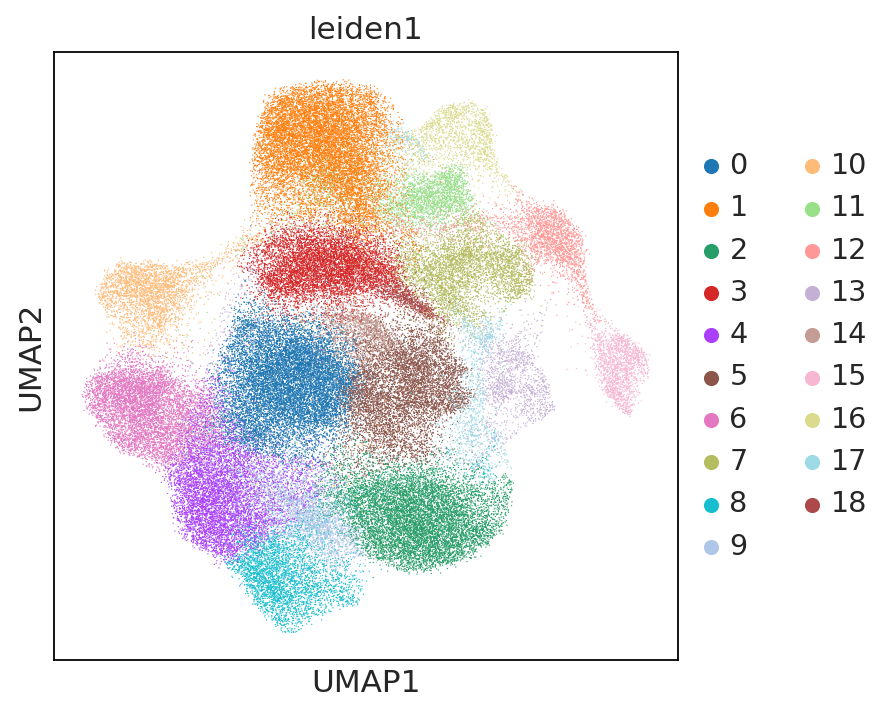

In [65]:
sc.pl.umap(adata,color='leiden1')

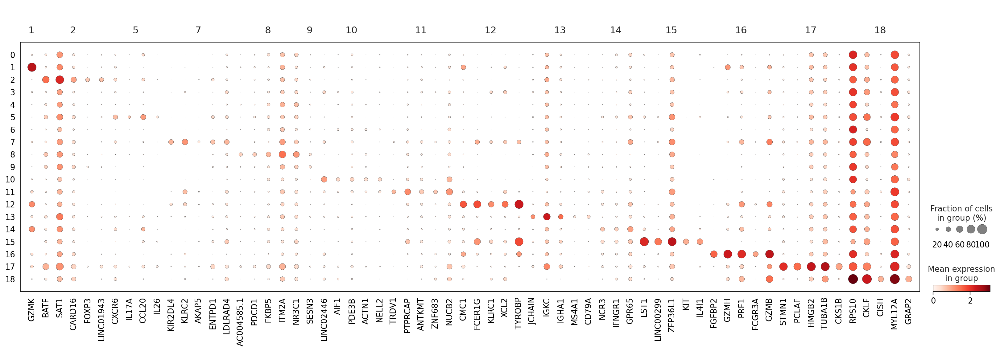

In [66]:
import sys
sys.path.append("/home/jovyan/ao15/Megagut/")
from re5_combine import *
adata.raw = adata.copy()
mkst = calc_marker_stats(adata, groupby="leiden1")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(adata, groupby='leiden1', mks=mks)

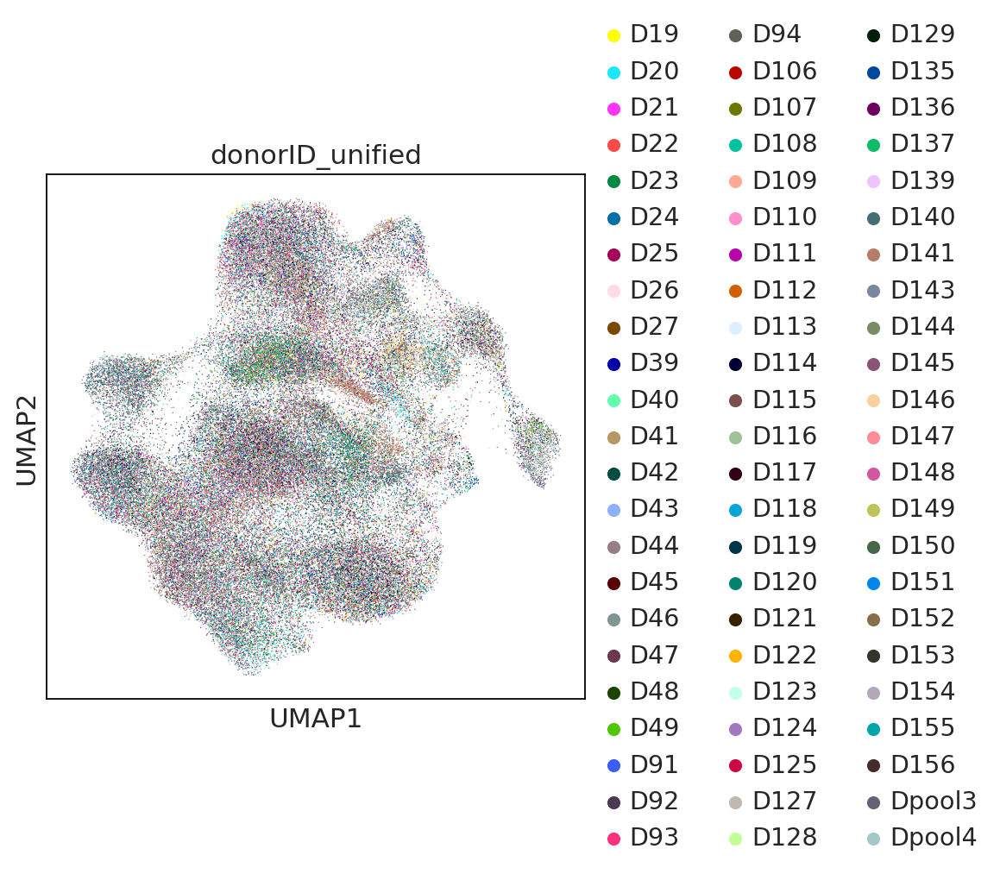

In [67]:
sc.pl.umap(adata,color='donorID_unified')

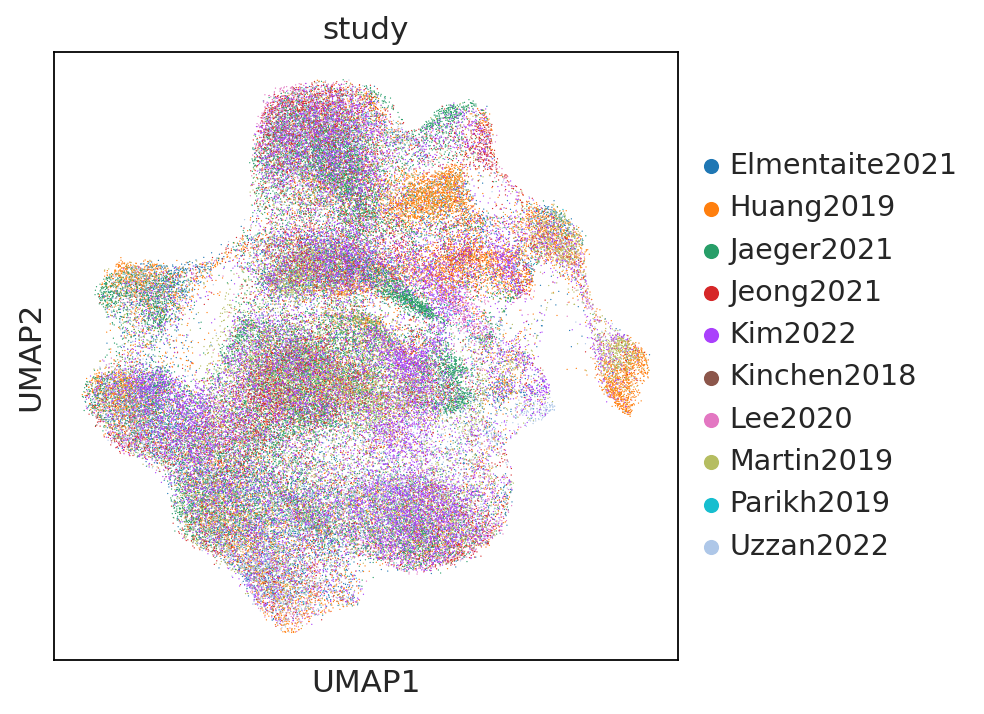

In [68]:
sc.pl.umap(adata,color='study')

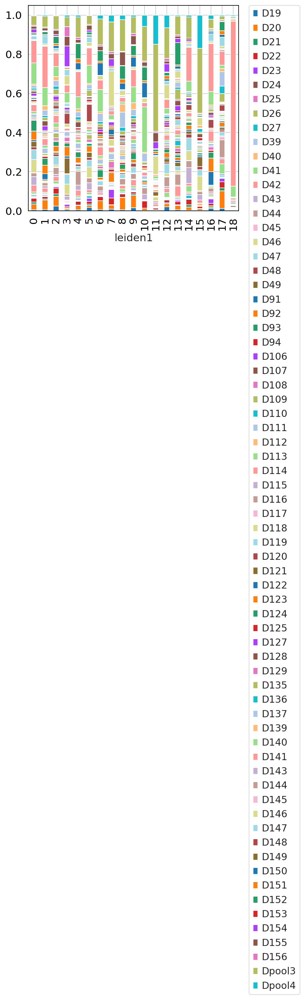

In [69]:
tmp = pd.crosstab(adata.obs['leiden1'], adata.obs['donorID_unified'],normalize='index'
                                                                         )
tmp.plot.bar(stacked=True).legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

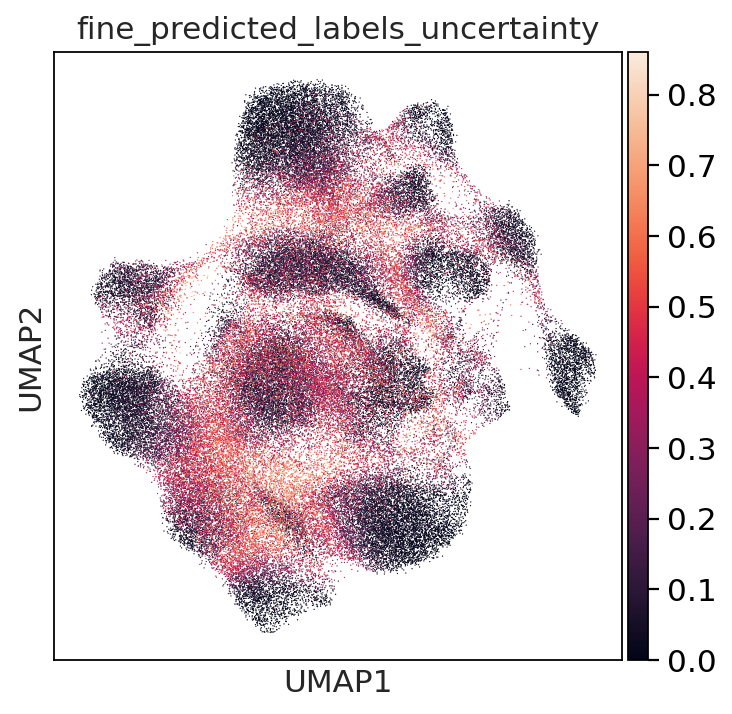

In [70]:
sc.pl.umap(adata,color='fine_predicted_labels_uncertainty')

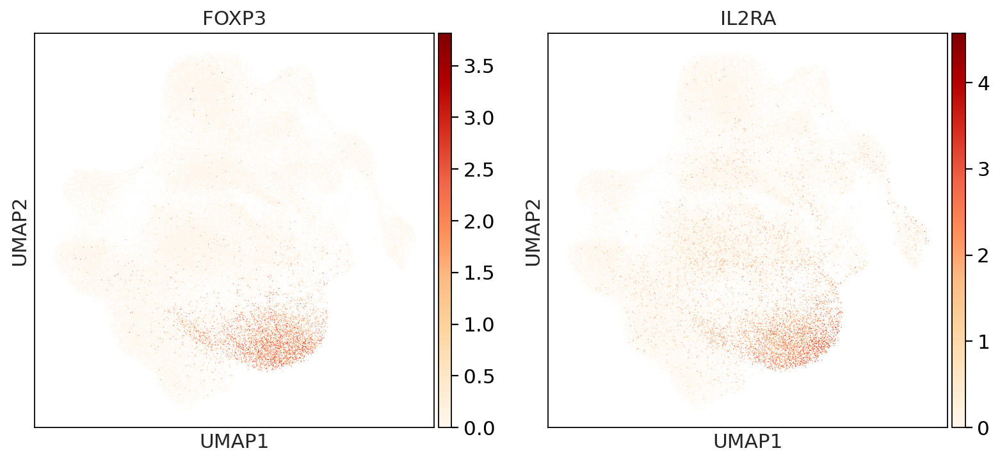

In [71]:
sc.pl.umap(adata,color=['FOXP3','IL2RA'],cmap='OrRd')

In [72]:
pd.crosstab(adata.obs.leiden1,adata.obs.fine_predicted_labels_uncertflagged)

fine_predicted_labels_uncertflagged,Doublets,ILC3,MAIT,NK_CD16,NK_CD56bright,T/NK_cycling,Tfh,Tfh_naive,Tnaive/cm_CD4,Tnaive/cm_CD8,Treg,Treg_IL10,Trm/em_CD8,Trm_CD4,Trm_CD8,Trm_Th17,Unknown,gdT,gdT_naive
leiden1,,,,,,,,,,,,,,,,,,,
0,959,2,1,0,0,0,0,15,265,0,0,2,1,8763,0,556,1174,0,0
1,35,0,1,1,6,0,8,0,1,0,0,22,10199,91,382,0,644,3,0
2,12,0,1,0,0,0,13,3,1,0,66,8539,4,71,0,21,421,0,0
3,108,0,0,0,0,0,0,0,2,4,0,0,9,259,6277,15,452,1,2
4,133,0,0,0,0,0,5,3555,1834,0,5,45,0,109,0,3,1340,0,0
5,20,0,46,0,0,0,2,3,0,0,0,116,8,723,29,5223,768,20,0
6,35,0,0,0,0,0,1,8,6274,0,3,0,3,81,0,0,136,0,1
7,20,4,0,0,14,22,3,0,0,0,0,3,47,0,553,60,466,3064,165
8,17,0,0,0,0,3,3030,214,81,0,1,103,0,0,0,2,574,0,0


In [73]:
#quick look at leiden resolution 0.5
sc.tl.leiden(adata,resolution=0.5,key_added='leiden0.5')

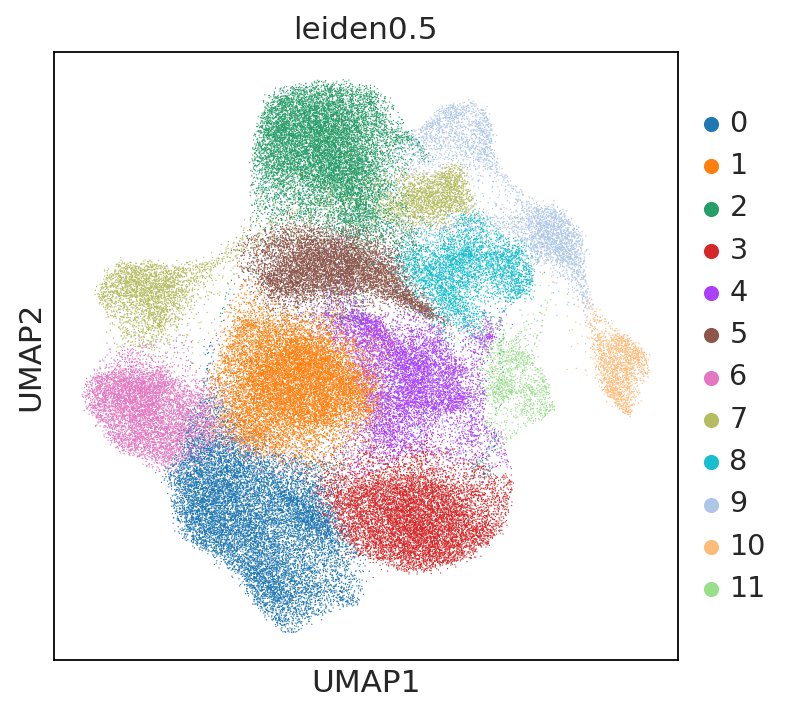

In [74]:
sc.pl.umap(adata,color='leiden0.5')

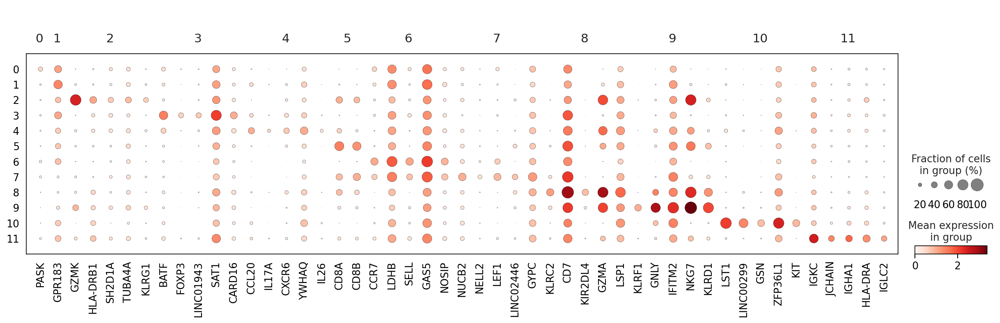

In [75]:
mkst = calc_marker_stats(adata, groupby="leiden0.5")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(adata, groupby='leiden0.5', mks=mks)

In [76]:
unknown['fine_predicted_labels_resolved'] = (unknown['leiden1']
        .map(lambda x:{'0':'Trm_CD4',
                       '1':'Trm/em_CD8',
                       '2':'Treg_IL10',
                       '3':'Trm_CD8', 
                       '4':'Tfh_naive',
                       '5':'Trm_Th17', 
                       '6':'Tnaive/cm_CD4',
                       '7':'gdT',
                       '8':'Tfh', 
                       '9':'Treg',
                       '10':'Tnaive/cm_CD8',
                       '11':'gdT_naive', #these could potentially be cancer cells
                       '12':'NK_CD56bright', 
                       '13':'Doublets',
                       '14':'MAIT',
                       '15':'ILC3',
                       '16':'NK_CD16',
                       '17':'T/NK_cycling',
                       '18':'Trm_CD8'
                         }.get(x,x)).astype('category'))

In [77]:
unknown

,leiden1,fine_predicted_labels_uncertflagged,fine_predicted_labels_resolved
index,,,
AACACGTCAAAGGAAG-4918STDY7273964,0,Unknown,Trm_CD4
AACACGTCATTTCACT-4918STDY7273964,8,Unknown,Tfh
AACTCAGAGTGTACTC-4918STDY7273964,6,Unknown,Tnaive/cm_CD4
AACTCAGCAACGCACC-4918STDY7273964,8,Unknown,Tfh
AACTCAGGTCCGAATT-4918STDY7273964,11,Unknown,gdT_naive
...,...,...,...
GACTGCGAGAGGGATA-GSM4546346,17,Unknown,T/NK_cycling
GAGTCCGAGTACCGGA-GSM4546346,11,Unknown,gdT_naive
TATCAGGCAGTATGCT-GSM4546346,7,Unknown,gdT


In [78]:
adata

AnnData object with n_obs × n_vars = 89537 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spl

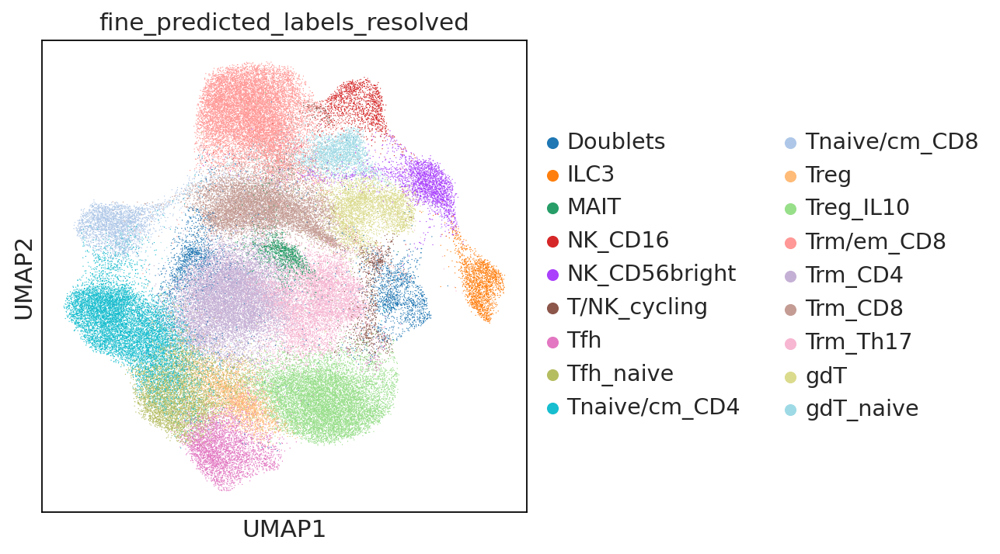

In [79]:
ON = {O:N for O,N in zip(unknown.index,unknown["fine_predicted_labels_resolved"])}
adata.obs["fine_predicted_labels_resolved"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["fine_predicted_labels_uncertflagged"])]
sc.pl.umap(adata,color='fine_predicted_labels_resolved')

In [80]:
no_doublets = adata[~adata.obs.fine_predicted_labels_resolved.isin(['Doublets'])].copy()

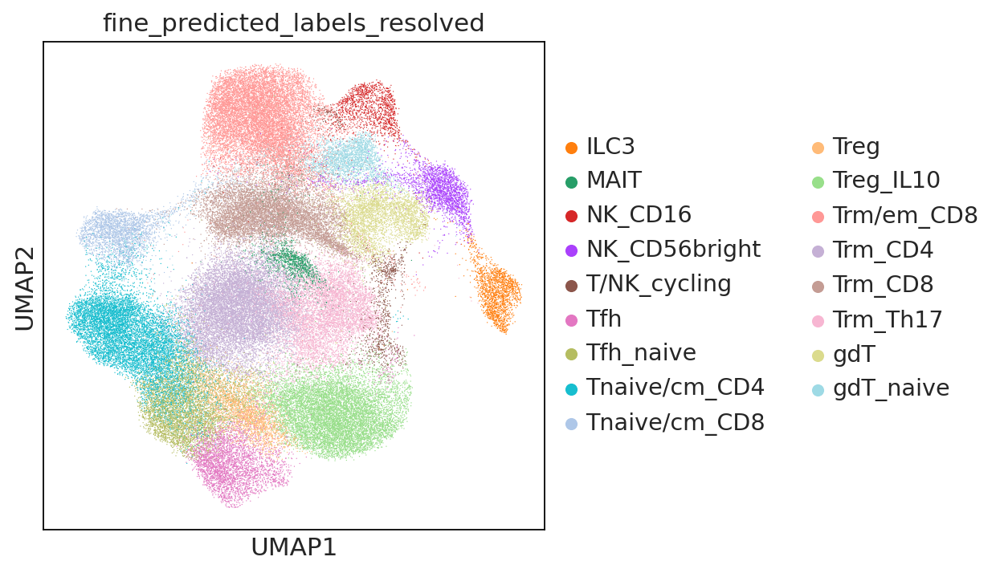

In [81]:
sc.pl.umap(no_doublets,color='fine_predicted_labels_resolved')

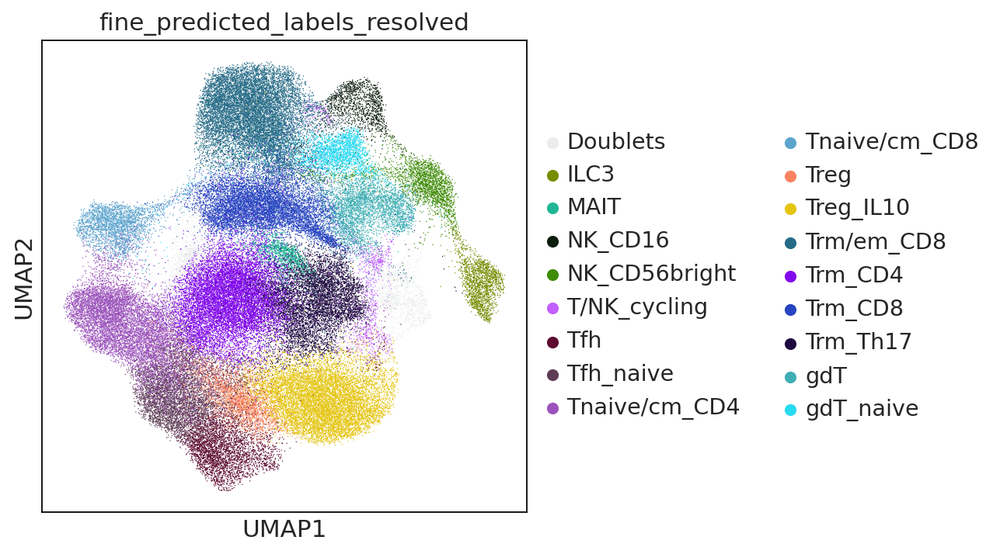

In [82]:
plt.rcParams['figure.figsize'] = [5,5]
sc.pl.umap(adata,color='fine_predicted_labels_resolved',palette = ['#ebeded',#doublets
                                                          '#778c00', #ILC3
'#21b796', #MAIT
'#0c1e0e',#NK_CD16
'#3f8c08', #NK CD56
'#c260ff',#T/NK cyling 
'#5e0b30',#Tfh
'#5e3c55',#tfh naive                             
'#9c53bc',#Tnaive/cm CD4
'#5ca4ce',#t naive/CM Cd8
'#f98261',#treg
'#e5c510',#treg il10
'#256b87',#Tem CD8
'#8107ed',#trm cd4                                
'#2844c1',#trm cd8
'#1e093f',#trm th17
                                                                        #'#000000',#unknown
'#3fafb5',#gdt                               
#'#5ac4e8',#Tem/emra cd8
                                                                           
'#26daf2',#gdt naive
                                               
                                               
    
    
                                              ],size=1.5)

In [83]:
annot = adata.obs[['fine_predicted_labels_uncertflagged','fine_predicted_labels_resolved']]

In [84]:
annot

,fine_predicted_labels_uncertflagged,fine_predicted_labels_resolved
index,,
AAACCTGAGGCCCTCA-4918STDY7273964,gdT_naive,gdT_naive
AAACCTGTCCAAACTG-4918STDY7273964,Tnaive/cm_CD4,Tnaive/cm_CD4
AAACGGGGTTAAGAAC-4918STDY7273964,Tfh_naive,Tfh_naive
AAACGGGGTTGAGGTG-4918STDY7273964,Tnaive/cm_CD4,Tnaive/cm_CD4
AAACGGGTCATAGCAC-4918STDY7273964,Tnaive/cm_CD4,Tnaive/cm_CD4
...,...,...
TTCCCAGAGCGTGAGT-GSM4546346,Trm_Th17,Trm_Th17
TTGCGTCGTACAGCAG-GSM4546346,Trm_Th17,Trm_Th17
TTTACTGTCGTGGTCG-GSM4546346,Unknown,Treg


In [85]:
#export final annotations
annot.to_csv('/nfs/team205/ao15/Megagut/Annotations_v3/disease_annot/resolved_annot/TNK_disease_annot.csv')